# 0. Google Colab Set up
+ This notebook is adpated from the demo provided in the offical github repository of Facial Action Unit Detector: https://github.com/rakutentech/FAU_CVPR2021

In [ ]:
# download pre-trained model
!gdown --id 1Wk9e78TVXMF0aQ4b4c0SovIJoJOMgHL5
!gdown --id 1p7hlZ3sxhbKoZjcACPVTeago1CESLZQ_
!gdown --id 1ZAHzRAnUB8JU0j6kVhgUZ5qA5x53XLo8
!gdown --id 1AmTfWS0SnkPhQT9DxAfCCIZ53z_PbGk7

/usr/local/lib/python3.10/dist-packages/gdown/cli.py:138: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  warnings.warn(
Downloading...
From (original): https://drive.google.com/uc?id=1Wk9e78TVXMF0aQ4b4c0SovIJoJOMgHL5
From (redirected): https://drive.google.com/uc?id=1Wk9e78TVXMF0aQ4b4c0SovIJoJOMgHL5&confirm=t&uuid=6b57c498-28c4-46ba-ad6e-48a345fae95f
To: /content/Transformer_FAU_fold0.h5
100% 161M/161M [00:01<00:00, 95.7MB/s]
/usr/local/lib/python3.10/dist-packages/gdown/cli.py:138: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  warnings.warn(
Downloading...
From (original): https://drive.google.com/uc?id=1p7hlZ3sxhbKoZjcACPVTeago1CESLZQ_
From (redirected): https://drive.google.com/uc?id=1p7hlZ3sxhbKoZjcACPVTeago1CESLZQ_&confirm=t&uuid=912d7ac4-46da-4c92-9a18-4555b93cdbeb
To: /content/Transformer_

In [ ]:
!pip install keras_pos_embd
!pip install keras_multi_head
!pip install keras_layer_normalization
!pip install keras_position_wise_feed_forward
!pip install keras_embed_sim

In [ ]:
import os
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
os.chdir('./drive/MyDrive/cmpt419 affective computing project')

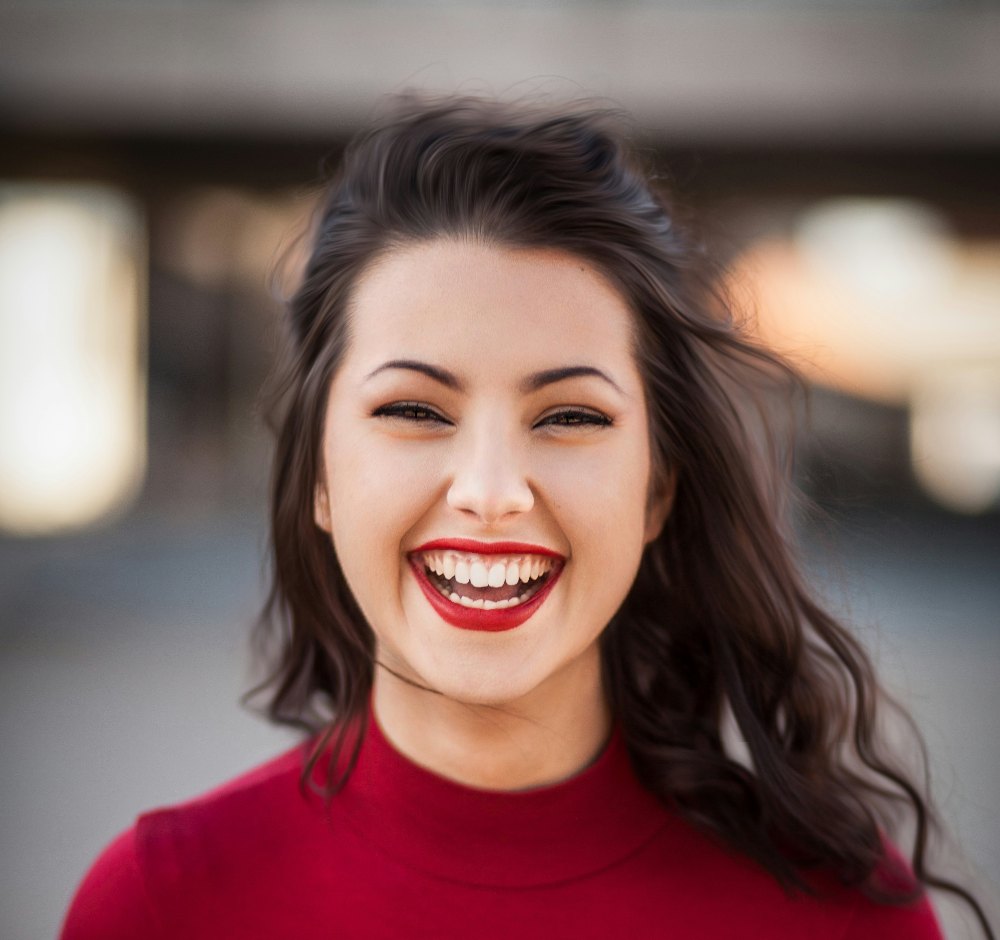

In [ ]:
import cv2
im = cv2.imread('./demo/face3.png')
import numpy as np
from google.colab.patches import cv2_imshow
cv2_imshow(im)

In [ ]:
# resize to (224, 224, 1) gray scale image
im = np.expand_dims(cv2.resize(im, dsize=(224,224)),axis=0)
print(im.shape)
AU_count =12

mapping_BP4D = {0:'Inner Brow Raiser',1:'Outer Brow Raiser',2:'Brow Lowerer',
          3:'Cheek raiser',4:'Lid Tightener',
          5:'Upper Lip Raiser',6:'Lip Corner Puller',
          7:'Dimpler',8:'Lip Corner Depressor',9:'Chin Raiser',
          10:'Lip Tightener',11:'Lip pressor'}

import tensorflow.compat.v1 as tf
tf.disable_v2_behavior()
from tensorflow.compat.v1.keras import backend as K
import logging
logging.getLogger('tensorflow').disabled = True
from tensorflow.keras import backend as K
from tensorflow.keras.layers import *
from tensorflow.keras.models import Model, load_model
from tensorflow.keras.optimizers import Adam,RMSprop
from tensorflow.keras.models import Sequential
from tensorflow.keras.applications.inception_v3 import InceptionV3
from keras_pos_embd import TrigPosEmbedding,PositionEmbedding
from keras_multi_head import MultiHeadAttention


(1, 224, 224, 3)


Instructions for updating:
non-resource variables are not supported in the long term


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.layers import Input, Activation, Conv2D,Conv2DTranspose, Flatten, Dense, MaxPooling2D,Multiply,AveragePooling2D, UpSampling2D,BatchNormalization,concatenate,Concatenate,ZeroPadding2D, GlobalAveragePooling2D, Dropout, Add
from tensorflow.keras.layers import dot, Reshape,RepeatVector, multiply,Lambda,add,Permute
from tensorflow.keras import backend as K
from keras_layer_normalization import LayerNormalization
from keras_multi_head import MultiHeadAttention
from keras_position_wise_feed_forward import FeedForward
from keras_pos_embd import TrigPosEmbedding
from keras_embed_sim import EmbeddingRet, EmbeddingSim


# 1. Model Setup
+ Define the transformer components and the set up the model architecture

In [ ]:
import math

def gelu(x):
    """An approximation of gelu.
    See: https://arxiv.org/pdf/1606.08415.pdf
    """
    return 0.5 * x * (1.0 + K.tanh(math.sqrt(2.0 / math.pi) * (x + 0.044715 * x * x * x)))



def get_custom_objects():
    return {
        'gelu': gelu,
        'LayerNormalization': LayerNormalization,
        'MultiHeadAttention': MultiHeadAttention,
        'FeedForward': FeedForward,
        'TrigPosEmbedding': TrigPosEmbedding,
        'EmbeddingRet': EmbeddingRet,
        'EmbeddingSim': EmbeddingSim,
    }


def _wrap_layer(name,
                input_layer,
                build_func,
                dropout_rate=0.0,
                trainable=True):
    """Wrap layers with residual, normalization and dropout.
    :param name: Prefix of names for internal layers.
    :param input_layer: Input layer.
    :param build_func: A callable that takes the input tensor and generates the output tensor.
    :param dropout_rate: Dropout rate.
    :param trainable: Whether the layers are trainable.
    :return: Output layer.
    """
    build_output = build_func(input_layer)
    if dropout_rate > 0.0:
        dropout_layer = Dropout(
            rate=dropout_rate,
            name='%s-Dropout' % name,
        )(build_output)
    else:
        dropout_layer = build_output
    if isinstance(input_layer, list):
        input_layer = input_layer[0]
    add_layer = Add(name='%s-Add' % name)([input_layer, dropout_layer])
    normal_layer = LayerNormalization(
        trainable=trainable,
        name='%s-Norm' % name,
    )(add_layer)
    return normal_layer



def attention_builder(name,
                      head_num,
                      activation,
                      history_only,
                      trainable=True):
    """Get multi-head self-attention builder.
    :param name: Prefix of names for internal layers.
    :param head_num: Number of heads in multi-head self-attention.
    :param activation: Activation for multi-head self-attention.
    :param history_only: Only use history data.
    :param trainable: Whether the layer is trainable.
    :return:
    """
    def _attention_builder(x):
        return MultiHeadAttention(
            head_num=head_num,
            activation=activation,
            history_only=history_only,
            trainable=trainable,
            name=name,
        )(x)
    return _attention_builder


def feed_forward_builder(name,
                         hidden_dim,
                         activation,
                         trainable=True):
    """Get position-wise feed-forward layer builder.
    :param name: Prefix of names for internal layers.
    :param hidden_dim: Hidden dimension of feed forward layer.
    :param activation: Activation for feed-forward layer.
    :param trainable: Whether the layer is trainable.
    :return:
    """
    def _feed_forward_builder(x):
        return FeedForward(
            units=hidden_dim,
            activation=activation,
            trainable=trainable,
            name=name,
        )(x)
    return _feed_forward_builder


def get_encoder_component(name,
                          input_layer,
                          head_num,
                          hidden_dim,
                          attention_activation=None,
                          feed_forward_activation=gelu,
                          dropout_rate=0.0,
                          trainable=True,):
    """Multi-head self-attention and feed-forward layer.
    :param name: Prefix of names for internal layers.
    :param input_layer: Input layer.
    :param head_num: Number of heads in multi-head self-attention.
    :param hidden_dim: Hidden dimension of feed forward layer.
    :param attention_activation: Activation for multi-head self-attention.
    :param feed_forward_activation: Activation for feed-forward layer.
    :param dropout_rate: Dropout rate.
    :param trainable: Whether the layers are trainable.
    :return: Output layer.
    """
    attention_name = '%s-MultiHeadSelfAttention' % name
    feed_forward_name = '%s-FeedForward' % name
    attention_layer = _wrap_layer(
        name=attention_name,
        input_layer=input_layer,
        build_func=attention_builder(
            name=attention_name,
            head_num=head_num,
            activation=attention_activation,
            history_only=False,
            trainable=trainable,
        ),
        dropout_rate=dropout_rate,
        trainable=trainable,
    )
    feed_forward_layer = _wrap_layer(
        name=feed_forward_name,
        input_layer=attention_layer,
        build_func=feed_forward_builder(
            name=feed_forward_name,
            hidden_dim=hidden_dim,
            activation=feed_forward_activation,
            trainable=trainable,
        ),
        dropout_rate=dropout_rate,
        trainable=trainable,
    )

    return feed_forward_layer




def get_encoders(name,encoder_num,
                 input_layer,
                 head_num,
                 hidden_dim,
                 attention_activation=None,
                 feed_forward_activation=gelu,
                 dropout_rate=0.0,
                 trainable=True):
    """Get encoders.
    :param encoder_num: Number of encoder components.
    :param input_layer: Input layer.
    :param head_num: Number of heads in multi-head self-attention.
    :param hidden_dim: Hidden dimension of feed forward layer.
    :param attention_activation: Activation for multi-head self-attention.
    :param feed_forward_activation: Activation for feed-forward layer.
    :param dropout_rate: Dropout rate.
    :param trainable: Whether the layers are trainable.
    :return: Output layer.
    """
    last_layer = input_layer
    for i in range(encoder_num):
        last_layer = get_encoder_component(
            name='%sEncoder-%d' % (name,i + 1),
            input_layer=last_layer,
            head_num=head_num,
            hidden_dim=hidden_dim,
            attention_activation=attention_activation,
            feed_forward_activation=feed_forward_activation,
            dropout_rate=dropout_rate,
            trainable=trainable,
        )
    return last_layer

In [ ]:
# use inception3 as the feature extractor and use a middle layer output as the feature
base_model = InceptionV3(weights="imagenet",
                         include_top=False, input_shape= (224,224,3))
base_model = Model(inputs=base_model.input,
                   outputs = base_model.get_layer('activation_74').output)

In [ ]:

def baseline_model(AU_count):
    fc_dim = 256
    # create model
    inputs = Input(shape=(224,224,3)) # the model can take in color image (gray scale image is also fine)

    #block 1
    g = base_model(inputs)

    gh = Conv2D(64, (3,3), padding='same',
                kernel_initializer='glorot_normal')(g)
    gh1 = Conv2D(AU_count, (1,1), padding='same',
                 kernel_initializer='glorot_normal')(gh)
    gh2 = Conv2D(AU_count, (1,1), padding='same',
                 activation='sigmoid',name = "att_loss",
                 kernel_initializer='glorot_normal')(gh1)
    gh1 = Conv2D(AU_count, (1,1), padding='same',
                 activation='linear',
                 kernel_initializer='glorot_normal')(gh1)
    gap = GlobalAveragePooling2D()(gh1)
    att_output = Activation('sigmoid',name="att_outputs")(gap)
    attention = gh2
    reshape_embed = Reshape([12*12,AU_count])(attention)
    reshape_embed = Permute((2,1))(reshape_embed)

    for i in range(AU_count):

        layer1 = Lambda(lambda x: K.expand_dims(attention[...,i],axis=-1))(attention)

        out = Multiply()([layer1,g])
        g = Add()([out,g])
        mt = Conv2D(64, (1,1), padding='same',
                    kernel_initializer='glorot_normal')(g)
        mt = MaxPooling2D(pool_size=7,
                          strides=(1,1),padding = 'same')(mt)
        mt = BatchNormalization()(mt)
        mt = Activation('relu')(mt)
        perception = Flatten()(mt)

        inter = Dense(fc_dim, activation='relu',
                      kernel_initializer='glorot_normal')(perception)
        tin = Lambda(lambda x: K.expand_dims(x,axis=1))(inter)

        if i==0:
            feat_outputs = tin
        else:
            feat_outputs= Concatenate(axis = 1, name = 'feat_outputs_{}'.format(i+1))([feat_outputs,tin])

    feat_outputs_P  = PositionEmbedding(
        input_shape=(None,),
        input_dim = AU_count,
        output_dim = fc_dim,
        mask_zero=0,  # The index that presents padding (because `0` will be used in relative positioning).
        mode=PositionEmbedding.MODE_ADD,)(feat_outputs)
    feat_outputs_P = get_encoders(name = '1',encoder_num=3,
                    input_layer=feat_outputs_P,
                    head_num=8,hidden_dim=fc_dim,
                    dropout_rate=0.1,)

    feat_outputs_P = Flatten()(feat_outputs_P)
    inter = Dense(fc_dim, activation='relu',
                  kernel_initializer='glorot_normal')(feat_outputs_P)
    final = Dense(AU_count, activation='sigmoid',
                  name = 'per_outputs_{}'.format(i+1),
                  kernel_initializer='glorot_normal')(inter)
    model = Model(inputs=inputs,
            outputs=[att_output,final,gh2,feat_outputs])#;model.summary()

    return model

model=baseline_model(AU_count)
model.load_weights('.Pretrained_Transformer_FAU_fold0.h5')



/usr/local/lib/python3.10/dist-packages/keras/src/engine/training_v1.py:2359: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,


In [ ]:
model.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_2 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 model (Functional)          (None, 12, 12, 192)          9640544   ['input_2[0][0]']             
                                                                                                  
 conv2d_94 (Conv2D)          (None, 12, 12, 64)           110656    ['model[0][0]']               
                                                                                                  
 conv2d_95 (Conv2D)          (None, 12, 12, 12)           780       ['conv2d_94[0][0]']           
                                                                                            

# 2. Do sample inference

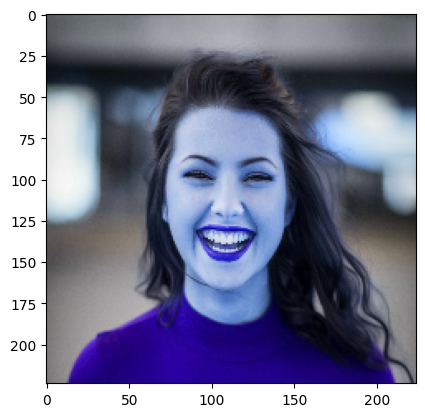

Cheek raiser
Lid Tightener
Upper Lip Raiser
Lip Corner Puller
Dimpler
Lip pressor


In [ ]:
y_predict = model.predict(im)
plt.imshow(im.squeeze())
plt.show()
ind = np.where(y_predict[1]>0.5)
for i in ind[1]:
    print(mapping_BP4D[i])

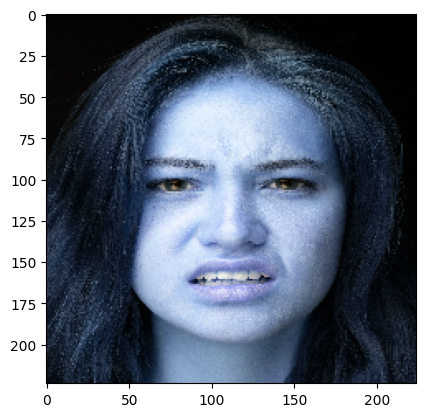

Cheek raiser
Lid Tightener
Upper Lip Raiser
Lip Corner Puller
Dimpler
Lip pressor


In [ ]:
im2 = cv2.imread('./demo/face4.jpg')
im2 = np.expand_dims(cv2.resize(im2, dsize=(224,224)),axis=0)
y_predict2 = model.predict(im2)
plt.imshow(im2.squeeze())
plt.show()
ind2 = np.where(y_predict2[1]>0.5)
for i in ind2[1]:
    print(mapping_BP4D[i])


# 3. Use pre-trained model on DISFA test set
+ The model is pretrained on BP4D dataset, diretly use to do inference on the DISFA dataset.

In [ ]:
# inference using pre-trained model
ind1 = [0, 1, 2, 3, 4, 6, 8, 10, 11, 12, 15, 16]
data_directory = './DISFA_fold/'

npz_files = [f for f in os.listdir(data_directory) if f.startswith('DISFA_fold0')]
y_pred_acc = []
y_pred_f1 = np.array([])
y_true_ex = []

for file_name in npz_files:
    data_test = data_directory + file_name
    print('Predicting ' + data_test)

    # Load data from .npz file
    x = np.load(data_test)
    x_train1 = x['x_train1']
    x_train1 = np.concatenate((x_train1, x_train1, x_train1), axis=-1)
    y_test = x['y_train']
    y_test = y_test[:, ind1]

    # Predict using the model
    y_predict = model.predict(x_train1)
    y_pred = y_predict[1]

    # Store predictions and ground truth for each file
    y_pred_acc.append(y_pred)
    y_true_ex.append(y_test)

# Concatenate predictions and ground truth arrays
y_pred_acc = np.vstack(y_pred_acc)
y_true_ex = np.vstack(y_true_ex)

Predicting ./DISFA_fold/DISFA_fold0_64.npz
Predicting ./DISFA_fold/DISFA_fold0_128.npz
Predicting ./DISFA_fold/DISFA_fold0_192.npz
Predicting ./DISFA_fold/DISFA_fold0_256.npz
Predicting ./DISFA_fold/DISFA_fold0_320.npz
Predicting ./DISFA_fold/DISFA_fold0_384.npz
Predicting ./DISFA_fold/DISFA_fold0_448.npz
Predicting ./DISFA_fold/DISFA_fold0_512.npz
Predicting ./DISFA_fold/DISFA_fold0_576.npz
Predicting ./DISFA_fold/DISFA_fold0_640.npz
Predicting ./DISFA_fold/DISFA_fold0_704.npz
Predicting ./DISFA_fold/DISFA_fold0_768.npz
Predicting ./DISFA_fold/DISFA_fold0_832.npz
Predicting ./DISFA_fold/DISFA_fold0_896.npz
Predicting ./DISFA_fold/DISFA_fold0_960.npz
Predicting ./DISFA_fold/DISFA_fold0_1024.npz
Predicting ./DISFA_fold/DISFA_fold0_1088.npz
Predicting ./DISFA_fold/DISFA_fold0_1152.npz
Predicting ./DISFA_fold/DISFA_fold0_1216.npz
Predicting ./DISFA_fold/DISFA_fold0_1280.npz
Predicting ./DISFA_fold/DISFA_fold0_1344.npz
Predicting ./DISFA_fold/DISFA_fold0_1408.npz
Predicting ./DISFA_fold/DI

In [ ]:
att_f1 = []
for l in range(AU_count):
    a = np.multiply(y_true_ex[:, l], 1)
    b = np.multiply(y_pred_acc[:, l] > 0.5, 1)
    TP = sum(np.multiply(np.logical_and(a == 1, b == 1), 1))
    FP = sum(np.multiply(np.logical_and(a == 0, b == 1), 1))
    FN = sum(np.multiply(np.logical_and(a == 1, b == 0), 1))
    TN = sum(np.multiply(np.logical_and(a == 0, b == 0), 1))
    Precision = TP / (TP + FP + 0.00001)
    print('TP',TP,'FP',FP,'FN',FN,'TN',TN)
    Recall = TP / (TP + FN + 0.00001)
    att_f1.append(2 * Precision * Recall / (Precision + Recall + 0.000001))
print(' f1 score ....', att_f1)